Importing Modules

In [71]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import string
import random
import nltk
import sklearn
nltk.download('wordnet')
import warnings
%matplotlib inline

warnings.filterwarnings('ignore')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\TanmayTP\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Loading dataset

In [72]:
df = pd.read_csv('Twitter_tweets.csv')
df.head()

,id,label,tweet
0,1,0,@user when a father is dysfunctional and is s...
1,2,0,@user @user thanks for #lyft credit i can't us...
2,3,0,bihday your majesty
3,4,0,#model i love u take with u all the time in ...
4,5,0,factsguide: society now #motivation


Preprocessing thr dataset

In [73]:
def remove_pattern(text, pattern):
    r = re.findall(pattern, text)
    for word in r:
        text = re.sub(word, "", text)
    return text

In [74]:



























































# removing twitter handles
df['clean_tweet'] = np.vectorize(remove_pattern)(df['tweet'], "@[\w]*")

df.head()


,id,label,tweet,clean_tweet
0,1,0,@user when a father is dysfunctional and is s...,when a father is dysfunctional and is so sel...
1,2,0,@user @user thanks for #lyft credit i can't us...,thanks for #lyft credit i can't use cause th...
2,3,0,bihday your majesty,bihday your majesty
3,4,0,#model i love u take with u all the time in ...,#model i love u take with u all the time in ...
4,5,0,factsguide: society now #motivation,factsguide: society now #motivation


In [75]:
df['clean_tweet'] = np.vectorize(remove_pattern)(df['tweet'], "ð[\w]*")
df.head()

,id,label,tweet,clean_tweet
0,1,0,@user when a father is dysfunctional and is s...,@user when a father is dysfunctional and is s...
1,2,0,@user @user thanks for #lyft credit i can't us...,@user @user thanks for #lyft credit i can't us...
2,3,0,bihday your majesty,bihday your majesty
3,4,0,#model i love u take with u all the time in ...,#model i love u take with u all the time in ...
4,5,0,factsguide: society now #motivation,factsguide: society now #motivation


In [76]:
# remove special characters, numbers and punctuations
df['clean_tweet'] = df['clean_tweet'].str.replace("[^a-zA-Z#]", " ")
df.head()

,id,label,tweet,clean_tweet
0,1,0,@user when a father is dysfunctional and is s...,user when a father is dysfunctional and is s...
1,2,0,@user @user thanks for #lyft credit i can't us...,user user thanks for #lyft credit i can t us...
2,3,0,bihday your majesty,bihday your majesty
3,4,0,#model i love u take with u all the time in ...,#model i love u take with u all the time in ...
4,5,0,factsguide: society now #motivation,factsguide society now #motivation


In [77]:
# remove short words
df['clean_tweet'] = df['clean_tweet'].apply(lambda x: " ".join([w for w in x.split() if len(w)>3]))
df.head()

,id,label,tweet,clean_tweet
0,1,0,@user when a father is dysfunctional and is s...,user when father dysfunctional selfish drags k...
1,2,0,@user @user thanks for #lyft credit i can't us...,user user thanks #lyft credit cause they offer...
2,3,0,bihday your majesty,bihday your majesty
3,4,0,#model i love u take with u all the time in ...,#model love take with time
4,5,0,factsguide: society now #motivation,factsguide society #motivation


In [78]:

stop_words = ['0o', '0s', '3a', '3b', '3d', '6b', '6o', 'a', 'a1', 'a2', 'a3', 'a4', 'ab', 'able', 'about', 'above', 'abst', 'ac', 'accordance', 'according', 'accordingly', 'across', 'act', 'actually', 'ad', 'added', 'adj', 'ae', 'af', 'affected', 'affecting', 'affects', 'after', 'afterwards', 'ag', 'again', 'against', 'ah', 'ain', "ain't", 'aj', 'al', 'all', 'allow', 'allows', 'almost', 'alone', 'along', 'already', 'also', 'although', 'always', 'am', 'among', 'amongst', 'amoungst', 'amount', 'an', 'and', 'announce', 'another', 'any', 'anybody', 'anyhow', 'anymore', 'anyone', 'anything', 'anyway', 'anyways', 'anywhere', 'ao', 'ap', 'apart', 'apparently', 'appear', 'appreciate', 'appropriate', 'approximately', 'ar', 'are', 'aren', 'arent', "aren't", 'arise', 'around', 'as', "a's", 'aside', 'ask', 'asking', 'associated', 'at', 'au', 'auth', 'av', 'available', 'aw', 'away', 'awfully', 'ax', 'ay', 'az', 'b', 'b1', 'b2', 'b3', 'ba', 'back', 'bc', 'bd', 'be', 'became', 'because', 'become', 'becomes', 'becoming', 'been', 'before', 'beforehand', 'begin', 'beginning', 'beginnings', 'begins', 'behind', 'being', 'believe', 'below', 'beside', 'besides', 'best', 'better', 'between', 'beyond', 'bi', 'bill', 'biol', 'bj', 'bk', 'bl', 'bn', 'both', 'bottom', 'bp', 'br', 'brief', 'briefly', 'bs', 'bt', 'bu', 'but', 'bx', 'by', 'c', 'c1', 'c2', 'c3', 'ca', 'call', 'came', 'can', 'cannot', 'cant', "can't", 'cause', 'causes', 'cc', 'cd', 'ce', 'certain', 'certainly', 'cf', 'cg', 'ch', 'changes', 'ci', 'cit', 'cj', 'cl', 'clearly', 'cm', "c'mon", 'cn', 'co', 'com', 'come', 'comes', 'con', 'concerning', 'consequently', 'consider', 'considering', 'contain', 'containing', 'contains', 'corresponding', 'could', 'couldn', 'couldnt', "couldn't", 'course', 'cp', 'cq', 'cr', 'cry', 'cs', "c's", 'ct', 'cu', 'currently', 'cv', 'cx', 'cy', 'cz', 'd', 'd2', 'da', 'date', 'dc', 'dd', 'de', 'definitely', 'describe', 'described', 'despite', 'detail', 'df', 'di', 'did', 'didn', "didn't", 'different', 'dj', 'dk', 'dl', 'do', 'does', 'doesn', "doesn't", 'doing', 'don', 'done', "don't", 'down', 'downwards', 'dp', 'dr', 'ds', 'dt', 'du', 'due', 'during', 'dx', 'dy', 'e', 'e2', 'e3', 'ea', 'each', 'ec', 'ed', 'edu', 'ee', 'ef', 'effect', 'eg', 'ei', 'eight', 'eighty', 'either', 'ej', 'el', 'eleven', 'else', 'elsewhere', 'em', 'empty', 'en', 'end', 'ending', 'enough', 'entirely', 'eo', 'ep', 'eq', 'er', 'es', 'especially', 'est', 'et', 'et-al', 'etc', 'eu', 'ev', 'even', 'ever', 'every', 'everybody', 'everyone', 'everything', 'everywhere', 'ex', 'exactly', 'example', 'except', 'ey', 'f', 'f2', 'fa', 'far', 'fc', 'few', 'ff', 'fi', 'fifteen', 'fifth', 'fify', 'fill', 'find', 'fire', 'first', 'five', 'fix', 'fj', 'fl', 'fn', 'fo', 'followed', 'following', 'follows', 'for', 'former', 'formerly', 'forth', 'forty', 'found', 'four', 'fr', 'from', 'front', 'fs', 'ft', 'fu', 'full', 'further', 'furthermore', 'fy', 'g', 'ga', 'gave', 'ge', 'get', 'gets', 'getting', 'gi', 'give', 'given', 'gives', 'giving', 'gj', 'gl', 'go', 'goes', 'going', 'gone', 'got', 'gotten', 'gr', 'greetings', 'gs', 'gy', 'h', 'h2', 'h3', 'had', 'hadn', "hadn't", 'happens', 'hardly', 'has', 'hasn', 'hasnt', "hasn't", 'have', 'haven', "haven't", 'having', 'he', 'hed', "he'd", "he'll", 'hello', 'help', 'hence', 'her', 'here', 'hereafter', 'hereby', 'herein', 'heres', "here's", 'hereupon', 'hers', 'herself', 'hes', "he's", 'hh', 'hi', 'hid', 'him', 'himself', 'his', 'hither', 'hj', 'ho', 'home', 'hopefully', 'how', 'howbeit', 'however', "how's", 'hr', 'hs', 'http', 'hu', 'hundred', 'hy', 'i', 'i2', 'i3', 'i4', 'i6', 'i7', 'i8', 'ia', 'ib', 'ibid', 'ic', 'id', "i'd", 'ie', 'if', 'ig', 'ignored', 'ih', 'ii', 'ij', 'il', "i'll", 'im', "i'm", 'immediate', 'immediately', 'importance', 'important', 'in', 'inasmuch', 'inc', 'indeed', 'index', 'indicate', 'indicated', 'indicates', 'information', 'inner', 'insofar', 'instead', 'interest', 'into', 'invention', 'inward', 'io', 'ip', 'iq', 'ir', 'is', 'isn', "isn't", 'it', 'itd', "it'd", "it'll", 'its', "it's", 'itself', 'iv', "i've", 'ix', 'iy', 'iz', 'j', 'jj', 'jr', 'js', 'jt', 'ju', 'just', 'k', 'ke', 'keep', 'keeps', 'kept', 'kg', 'kj', 'km', 'know', 'known', 'knows', 'ko', 'l', 'l2', 'la', 'largely', 'last', 'lately', 'later', 'latter', 'latterly', 'lb', 'lc', 'le', 'least', 'les', 'less', 'lest', 'let', 'lets', "let's", 'lf', 'like', 'liked', 'likely', 'line', 'little', 'lj', 'll', 'll', 'ln', 'lo', 'look', 'looking', 'looks', 'los', 'lr', 'ls', 'lt', 'ltd', 'm', 'm2', 'ma', 'made', 'mainly', 'make', 'makes', 'many', 'may', 'maybe', 'me', 'mean', 'means', 'meantime', 'meanwhile', 'merely', 'mg', 'might', 'mightn', "mightn't", 'mill', 'million', 'mine', 'miss', 'ml', 'mn', 'mo', 'more', 'moreover', 'most', 'mostly', 'move', 'mr', 'mrs', 'ms', 'mt', 'mu', 'much', 'mug', 'must', 'mustn', "mustn't", 'my', 'myself', 'n', 'n2', 'na', 'name', 'namely', 'nay', 'nc', 'nd', 'ne', 'near', 'nearly', 'necessarily', 'necessary', 'need', 'needn', "needn't", 'needs', 'neither', 'never', 'nevertheless', 'new', 'next', 'ng', 'ni', 'nine', 'ninety', 'nj', 'nl', 'nn', 'no', 'nobody', 'non', 'none', 'nonetheless', 'noone', 'nor', 'normally', 'nos', 'not', 'noted', 'nothing', 'novel', 'now', 'nowhere', 'nr', 'ns', 'nt', 'ny', 'o', 'oa', 'ob', 'obtain', 'obtained', 'obviously', 'oc', 'od', 'of', 'off', 'often', 'og', 'oh', 'oi', 'oj', 'ok', 'okay', 'ol', 'old', 'om', 'omitted', 'on', 'once', 'one', 'ones', 'only', 'onto', 'oo', 'op', 'oq', 'or', 'ord', 'os', 'ot', 'other', 'others', 'otherwise', 'ou', 'ought', 'our', 'ours', 'ourselves', 'out', 'outside', 'over', 'overall', 'ow', 'owing', 'own', 'ox', 'oz', 'p', 'p1', 'p2', 'p3', 'page', 'pagecount', 'pages', 'par', 'part', 'particular', 'particularly', 'pas', 'past', 'pc', 'pd', 'pe', 'per', 'perhaps', 'pf', 'ph', 'pi', 'pj', 'pk', 'pl', 'placed', 'please', 'plus', 'pm', 'pn', 'po', 'poorly', 'possible', 'possibly', 'potentially', 'pp', 'pq', 'pr', 'predominantly', 'present', 'presumably', 'previously', 'primarily', 'probably', 'promptly', 'proud', 'provides', 'ps', 'pt', 'pu', 'put', 'py', 'q', 'qj', 'qu', 'que', 'quickly', 'quite', 'qv', 'r', 'r2', 'ra', 'ran', 'rather', 'rc', 'rd', 're', 'readily', 'really', 'reasonably', 'recent', 'recently', 'ref', 'refs', 'regarding', 'regardless', 'regards', 'related', 'relatively', 'research', 'research-articl', 'respectively', 'resulted', 'resulting', 'results', 'rf', 'rh', 'ri', 'right', 'rj', 'rl', 'rm', 'rn', 'ro', 'rq', 'rr', 'rs', 'rt', 'ru', 'run', 'rv', 'ry', 's', 's2', 'sa', 'said', 'same', 'saw', 'say', 'saying', 'says', 'sc', 'sd', 'se', 'sec', 'second', 'secondly', 'section', 'see', 'seeing', 'seem', 'seemed', 'seeming', 'seems', 'seen', 'self', 'selves', 'sensible', 'sent', 'serious', 'seriously', 'seven', 'several', 'sf', 'shall', 'shan', "shan't", 'she', 'shed', "she'd", "she'll", 'shes', "she's", 'should', 'shouldn', "shouldn't", "should've", 'show', 'showed', 'shown', 'showns', 'shows', 'si', 'side', 'significant', 'significantly', 'similar', 'similarly', 'since', 'sincere', 'six', 'sixty', 'sj', 'sl', 'slightly', 'sm', 'sn', 'so', 'some', 'somebody', 'somehow', 'someone', 'somethan', 'something', 'sometime', 'sometimes', 'somewhat', 'somewhere', 'soon', 'sorry', 'sp', 'specifically', 'specified', 'specify', 'specifying', 'sq', 'sr', 'ss', 'st', 'still', 'stop', 'strongly', 'sub', 'substantially', 'successfully', 'such', 'sufficiently', 'suggest', 'sup', 'sure', 'sy', 'system', 'sz', 't', 't1', 't2', 't3', 'take', 'taken', 'taking', 'tb', 'tc', 'td', 'te', 'tell', 'ten', 'tends', 'tf', 'th', 'than', 'thank', 'thanks', 'thanx', 'that', "that'll", 'thats', "that's", "that've", 'the', 'their', 'theirs', 'them', 'themselves', 'then', 'thence', 'there', 'thereafter', 'thereby', 'thered', 'therefore', 'therein', "there'll", 'thereof', 'therere', 'theres', "there's", 'thereto', 'thereupon', "there've", 'these', 'they', 'theyd', "they'd", "they'll", 'theyre', "they're", "they've", 'thickv', 'thin', 'think', 'third', 'this', 'thorough', 'thoroughly', 'those', 'thou', 'though', 'thoughh', 'thousand', 'three', 'throug', 'through', 'throughout', 'thru', 'thus', 'ti', 'til', 'tip', 'tj', 'tl', 'tm', 'tn', 'to', 'together', 'too', 'took', 'top', 'toward', 'towards', 'tp', 'tq', 'tr', 'tried', 'tries', 'truly', 'try', 'trying', 'ts', "t's", 'tt', 'tv', 'twelve', 'twenty', 'twice', 'two', 'tx', 'u','u201d', 'ue', 'ui', 'uj', 'uk', 'um', 'un', 'under', 'unfortunately', 'unless', 'unlike', 'unlikely', 'until', 'unto', 'uo', 'up', 'upon', 'ups', 'ur', 'us', 'use', 'used', 'useful', 'usefully', 'usefulness', 'uses', 'using', 'usually', 'ut', 'v', 'va', 'value', 'various', 'vd', 've', 've', 'very', 'via', 'viz', 'vj', 'vo', 'vol', 'vols', 'volumtype', 'vq', 'vs', 'vt', 'vu', 'w', 'wa', 'want', 'wants', 'was', 'wasn', 'wasnt', "wasn't", 'way', 'we', 'wed', "we'd", 'welcome', 'well', "we'll", 'well-b', 'went', 'were', "we're", 'weren', 'werent', "weren't", "we've", 'what', 'whatever', "what'll", 'whats', "what's", 'when', 'whence', 'whenever', "when's", 'where', 'whereafter', 'whereas', 'whereby', 'wherein', 'wheres', "where's", 'whereupon', 'wherever', 'whether', 'which', 'while', 'whim', 'whither', 'who', 'whod', 'whoever', 'whole', "who'll", 'whom', 'whomever', 'whos', "who's", 'whose', 'why', "why's", 'wi', 'widely', 'will', 'willing', 'wish', 'with', 'within', 'without', 'wo', 'won', 'wonder', 'wont', "won't", 'words', 'world', 'would', 'wouldn', 'wouldnt', "wouldn't", 'www', 'x', 'x1', 'x2', 'x3', 'xf', 'xi', 'xj', 'xk', 'xl', 'xn', 'xo', 'xs', 'xt', 'xv', 'xx', 'y', 'y2', 'yes', 'yet', 'yj', 'yl', 'you', 'youd', "you'd", "you'll", 'your', 'youre', "you're", 'yours', 'yourself', 'yourselves', "you've", 'yr', 'ys', 'yt', 'z', 'zero', 'zi', 'zz']         

In [79]:
# remove stop words
def remove_stop_words(text):
    
    global stop_words

    if( (text is None) or (len(text) == 0)):
        pass

    tokens = text.split()
    clean_tokens = [t for t in tokens if not t in stop_words]
    clean_text = " ".join(clean_tokens)
    return clean_text


df['clean_tweet'] = (df['clean_tweet'].map(remove_stop_words))

df.head()

,id,label,tweet,clean_tweet
0,1,0,@user when a father is dysfunctional and is s...,user father dysfunctional selfish drags kids d...
1,2,0,@user @user thanks for #lyft credit i can't us...,user user #lyft credit offer wheelchair vans #...
2,3,0,bihday your majesty,bihday majesty
3,4,0,#model i love u take with u all the time in ...,#model love time
4,5,0,factsguide: society now #motivation,factsguide society #motivation


Finding Polarity

In [80]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

sentimentAnalyser = SentimentIntensityAnalyzer()

for sentence in df['clean_tweet']:
    sentiment_scores = sentimentAnalyser.polarity_scores(sentence)
    print(f"""'{sentence}' \n
🙁 Negative Sentiment: {sentiment_scores['neg']} \n  
😐 Neutral Sentiment: {sentiment_scores['neu']} \n
😀 Positive Sentiment: {sentiment_scores['pos']} \n
✨ Compound Sentiment: {sentiment_scores['compound']} \n
--- \n""")

'user father dysfunctional selfish drags kids dysfunction #run' 

🙁 Negative Sentiment: 0.603 
  
😐 Neutral Sentiment: 0.397 

😀 Positive Sentiment: 0.0 

✨ Compound Sentiment: -0.765 

--- 

'user user #lyft credit offer wheelchair vans #disapointed #getthanked' 

🙁 Negative Sentiment: 0.0 
  
😐 Neutral Sentiment: 0.755 

😀 Positive Sentiment: 0.245 

✨ Compound Sentiment: 0.3818 

--- 

'bihday majesty' 

🙁 Negative Sentiment: 0.0 
  
😐 Neutral Sentiment: 1.0 

😀 Positive Sentiment: 0.0 

✨ Compound Sentiment: 0.0 

--- 

'#model love time' 

🙁 Negative Sentiment: 0.0 
  
😐 Neutral Sentiment: 0.323 

😀 Positive Sentiment: 0.677 

✨ Compound Sentiment: 0.6369 

--- 

'factsguide society #motivation' 

🙁 Negative Sentiment: 0.0 
  
😐 Neutral Sentiment: 0.455 

😀 Positive Sentiment: 0.545 

✨ Compound Sentiment: 0.34 

--- 

'huge fare talking leave chaos disputes #allshowandnogo' 

🙁 Negative Sentiment: 0.569 
  
😐 Neutral Sentiment: 0.244 

😀 Positive Sentiment: 0.187 

✨ Compound Sen

In [81]:
def calculate_sentiment(text):
    scores = sentimentAnalyser.polarity_scores(text)
    compound_score = scores['compound']
    return compound_score


df['polarity'] = np.vectorize(calculate_sentiment)(df['tweet'])
df.head()

,id,label,tweet,clean_tweet,polarity
0,1,0,@user when a father is dysfunctional and is s...,user father dysfunctional selfish drags kids d...,-0.8296
1,2,0,@user @user thanks for #lyft credit i can't us...,user user #lyft credit offer wheelchair vans #...,0.6705
2,3,0,bihday your majesty,bihday majesty,0.0000
3,4,0,#model i love u take with u all the time in ...,#model love time,0.7249
4,5,0,factsguide: society now #motivation,factsguide society #motivation,0.3400


In [82]:
df.sort_values(by='polarity', ascending=False)[:10]

,id,label,tweet,clean_tweet,polarity
10535,10536,0,"love is love is love is love, and love celebra...",love love love love love celebrating love #wed...,0.9897
22502,22503,0,"three awards for our play ""only my love can la...",awards play love forever director scenic desig...,0.9837
6722,6723,0,enjoy! #weekend #enjoy #good #times #joy #s...,enjoy #weekend #enjoy #good #times #joy #smile...,0.9831
11415,11416,0,"have a great weekend, friends. #pay #fun #gr...",great weekend friends #pay #fun #great #like #...,0.9816
21143,21144,0,love you...!!! ððð #friend #friends #...,love #friend #friends #fun #funny #love #insta...,0.9812
18848,18849,0,with true love you can win one person with tru...,true love person true possion #love #fact #lif...,0.9796
20232,20233,0,@user today is my #bihday :) ! c'est mon #ann...,user today #bihday #anniversaire #enjoy #sun #...,0.9796
6689,6690,0,happy best friends day!!! #pbcrave #bff #best...,happy friends #pbcrave #bff #bestfriends #love...,0.9783
25868,25869,0,i love having such amazing friends @user thank...,love amazing friends user staing laughs #close...,0.9779
14913,14914,0,father's day# i am extremely blessed to have...,father day# extremely blessed beautiful wonder...,0.9778


In [83]:
df.sort_values(by='polarity', ascending=True)[:10]

,id,label,tweet,clean_tweet,polarity
10427,10428,0,father lying through his ass. #terrorism #homo...,father lying #terrorism #homophobia #orlando #...,-0.9774
18497,18498,1,"content: #abuse, #pedophilia, #stalking, #hara...",content #abuse #pedophilia #stalking #harassme...,-0.9756
10518,10519,0,what a terrible week in news. #jocox murder is...,terrible week news #jocox murder tragic terrib...,-0.9752
27771,27772,0,#alone #depressed #depression #selfharm #sui...,#alone #depressed #depression #selfharm #suici...,-0.9741
23011,23012,0,i hate how i used to be hungry to travel the w...,hate hungry travel stay avoid raped #migrants ...,-0.9740
30290,30291,1,@user @user why do we have listen to a woman w...,user user listen woman church kills thousands ...,-0.9735
1586,1587,1,"if talking about makes racism worst, with tha...",talking racism worst logic talking talking rac...,-0.9702
29688,29689,0,big girl cryð­.. #socialanxiety #selfharming...,girl #socialanxiety #selfharming #suicide #sui...,-0.9652
2784,2785,1,happy newyear! #sameshitnewyear #corruption #t...,happy newyear #sameshitnewyear #corruption #tr...,-0.9652
17754,17755,0,shadows ð»ð #socialanxiety #selfharming ...,shadows #socialanxiety #selfharming #suicide #...,-0.9652


In [84]:
df = df.set_index('id')
df.head(2)

,label,tweet,clean_tweet,polarity
id,,,,
1,0,@user when a father is dysfunctional and is s...,user father dysfunctional selfish drags kids d...,-0.8296
2,0,@user @user thanks for #lyft credit i can't us...,user user #lyft credit offer wheelchair vans #...,0.6705


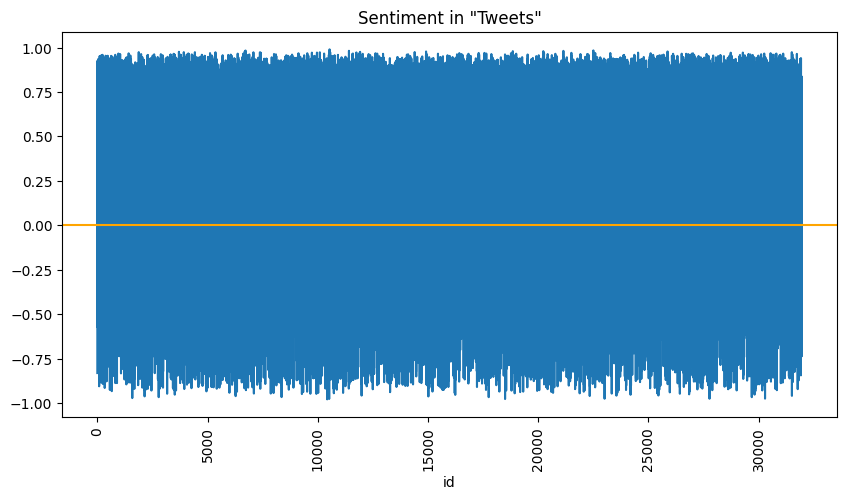

In [85]:
ax = df['polarity'].plot(x='id', y='polarity', kind='line',
                        figsize=(10,5), rot=90, title='Sentiment in "Tweets"')

# Plot a horizontal line at 0
plt.axhline(y=0, color='orange', linestyle='-')

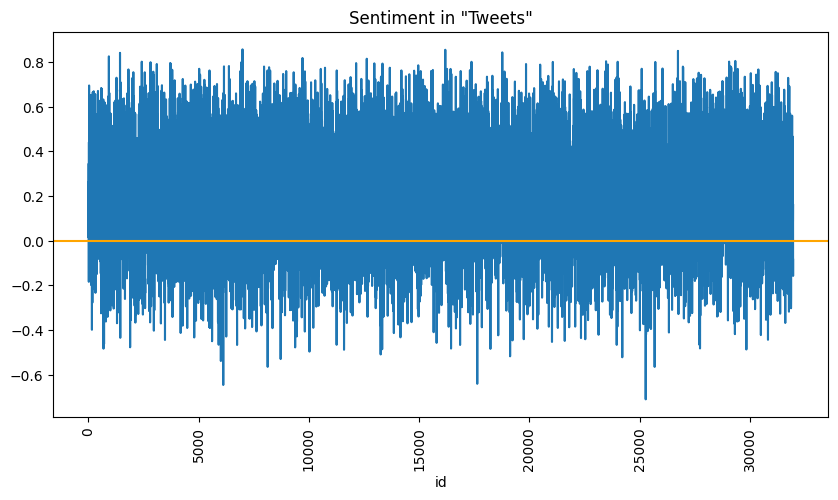

In [86]:
# getting a “rolling average” 5 sentences at a time 
df.rolling(5)['polarity'].mean().plot(x='id', y='polarity', kind='line',
                        figsize=(10,5), rot=90, title='Sentiment in "Tweets"')

plt.axhline(y=0, color='orange', linestyle='-')

In [87]:
# Tokenization
tokenized_tweet = df['clean_tweet'].apply(lambda x: x.split())
tokenized_tweet.head()

id
1    [user, father, dysfunctional, selfish, drags, ...
2    [user, user, #lyft, credit, offer, wheelchair,...
3                                    [bihday, majesty]
4                                 [#model, love, time]
5                   [factsguide, society, #motivation]
Name: clean_tweet, dtype: object

In [88]:
# Stemming
from porter_stemmer import PorterStemmer
stemmer = PorterStemmer()

tokenized_tweet = tokenized_tweet.apply(lambda sentence: [stemmer.stem_word(word) for word in sentence])
tokenized_tweet.head()

id
1    [us, fath, dysfunct, selfish, drag, kid, dysfu...
2    [us, us, #lyft, credit, off, wheelchair, van, ...
3                                    [bihdai, majesti]
4                                 [#model, love, time]
5                         [factsguid, societi, #motiv]
Name: clean_tweet, dtype: object

Extracting Hashtags

In [89]:
# extract the hashtag
def hashtag_extract(tweets):
    hashtags = []
    for tweet in tweets:
        ht = re.findall(r"#(\w+)", tweet)
        hashtags.append(ht)
    return hashtags

In [90]:
# extract hashtags from non-racist/sexist tweets
ht_positive = hashtag_extract(df['clean_tweet'][df['polarity']>=0])

# extract hashtags from racist/sexist tweets
ht_negative = hashtag_extract(df['clean_tweet'][df['label']<=0])

In [91]:
ht_positive[:5]

[['lyft', 'disapointed', 'getthanked'], [], ['model'], ['motivation'], []]

In [92]:
# unnest list
ht_positive = sum(ht_positive, [])
ht_negative = sum(ht_negative, [])

In [93]:
ht_positive[:5]

['lyft', 'disapointed', 'getthanked', 'model', 'motivation']

In [94]:
freq = nltk.FreqDist(ht_positive)
d = pd.DataFrame({'Hashtag': list(freq.keys()),
                 'Count': list(freq.values())})
d.head()

,Hashtag,Count
0,lyft,1
1,disapointed,1
2,getthanked,2
3,model,363
4,motivation,150


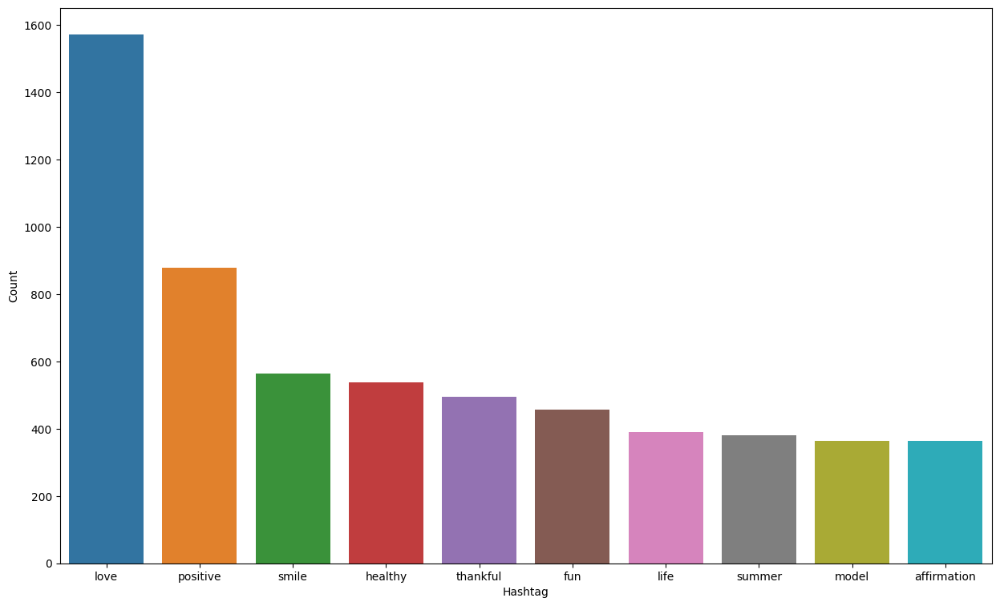

In [95]:
# select top 10 hashtags
d = d.nlargest(columns='Count', n=10)
plt.figure(figsize=(15,9))
sns.barplot(data=d, x='Hashtag', y='Count')
plt.show()

In [96]:
freq = nltk.FreqDist(ht_negative)
d = pd.DataFrame({'Hashtag': list(freq.keys()),
                 'Count': list(freq.values())})
d.head()

,Hashtag,Count
0,run,34
1,lyft,2
2,disapointed,1
3,getthanked,2
4,model,365


BAG OF WORDS

In [97]:
from sklearn.feature_extraction.text import CountVectorizer

bow_vectorizer = CountVectorizer(max_df=0.90, min_df=2, max_features=1000)
bow = bow_vectorizer.fit_transform(df['clean_tweet'])
bow[0].toarray()

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [98]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(bow, df['label'], random_state=42, test_size=0.25)

Model Training

In [99]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score

In [100]:
# training
model = LogisticRegression()
model.fit(x_train, y_train)

LogisticRegression()

In [101]:
# testing
prediction = model.predict(x_test)
f1_score(y_test, prediction)

0.4920049200492005

In [102]:
accuracy_score(y_test, prediction)

0.9483168564635215

In [103]:
prediction_probability = model.predict_proba(x_test)
prediction = prediction_probability[:, 1] >= 0.3
prediction = prediction.astype(np.int)
f1_score(y_test, prediction)

0.5424083769633509

In [104]:
accuracy_score(y_test, prediction)

0.9453134776623702

In [105]:
prediction_probability[0][1] >= 0.3

False